<a href="https://colab.research.google.com/github/madenni/NN-DIP/blob/main/NS3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Задание №1. Использование глубокой сверточной нейронной сети для классификации предметов одежды на примере датасета Fashion MNIST


[Техническая документация по датасету](https://www.kaggle.com/datasets/zalando-research/fashionmnist)

## 1.1. Устанавливаем необходимые зависимости

In [ ]:
from keras.datasets import fashion_mnist # импорт исходного датасета
from keras.models import Sequential
 
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
 
from keras.optimizers import Adam, SGD
import matplotlib.pyplot as plt
import numpy as np
import keras
import cv2

## 1.2. Разделяем данные на обучающую и тестовую выборку

In [ ]:
(trainX, trainy), (testX, testy) = fashion_mnist.load_data()
 
trainX = trainX / 255
testX = testX / 255

y_train_cat = keras.utils.to_categorical(trainy, 10)
y_test_cat = keras.utils.to_categorical(testy, 10)

trainX = np.expand_dims(trainX, axis=3)
testX = np.expand_dims(testX, axis=3)

print('Train: X = ', trainX.shape)
print('Test: X = ', testX.shape)

Train: X =  (60000, 28, 28, 1)
Test: X =  (10000, 28, 28, 1)


## 1.3. Визуализируем часть данных из датасета

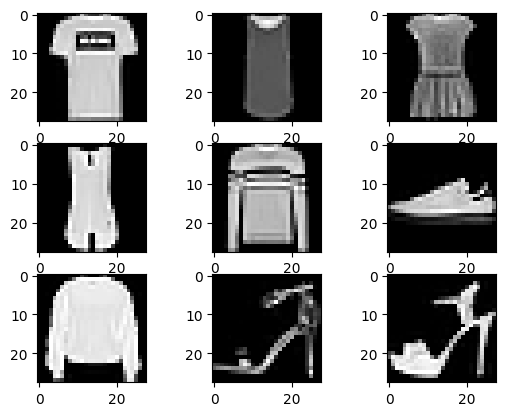

In [ ]:
for i in range(1, 10):
    plt.subplot(3, 3, i)
    plt.imshow(trainX[i], cmap=plt.get_cmap('gray'))
 
plt.show()

## 1.4. Создаём архитектуру нейронной сети и компилируем модель

In [ ]:
model = keras.Sequential([
    Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(28, 28, 1)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(10,  activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 64)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 3136)              0         
                                                                 
 dense (Dense)               (None, 128)               4

## 1.5. Обучаем модель

In [ ]:
EPOCH = 3

model.compile(optimizer='adam',
             loss='categorical_crossentropy',
             metrics=['accuracy'])


his = model.fit(trainX, y_train_cat, batch_size=32, epochs=EPOCH, validation_split=0.2)

model.evaluate(testX, y_test_cat)

Epoch 1/3
1500/1500 [==============================] - 47s 31ms/step - loss: 0.4219 - accuracy: 0.8473 - val_loss: 0.2987 - val_accuracy: 0.8932
Epoch 2/3
1500/1500 [==============================] - 45s 30ms/step - loss: 0.2761 - accuracy: 0.9006 - val_loss: 0.2822 - val_accuracy: 0.8963
Epoch 3/3
313/313 [==============================] - 2s 7ms/step - loss: 0.2647 - accuracy: 0.9039


[0.26471105217933655, 0.9039000272750854]

## 1.5. Анализируем обученную модель. Строим график (графики) обучения

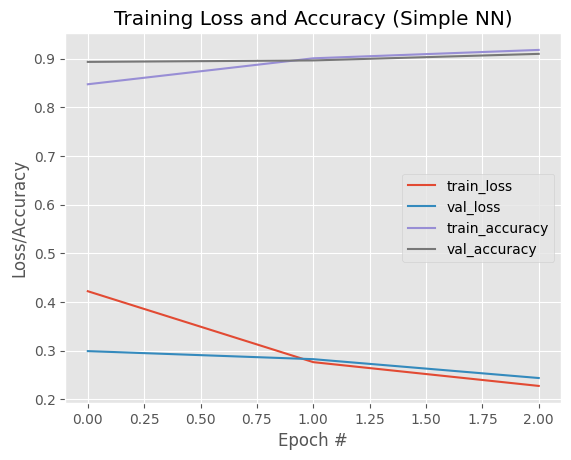

In [ ]:
N = np.arange(0, EPOCH)
plt.style.use("ggplot")
plt.figure()
plt.plot(N, his.history["loss"], label="train_loss")
plt.plot(N, his.history["val_loss"], label="val_loss")
plt.plot(N, his.history["accuracy"], label="train_accuracy")
plt.plot(N, his.history["val_accuracy"], label="val_accuracy")
plt.title("Training Loss and Accuracy (Simple NN)")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

In [ ]:
import pickle
model.save("model2.h5", save_format="h5")


## 1.6. Загружаем свои изображения. С помощью функции predict() получаем предсказание нейронной сети



> Требуется получить предсказания минимум по 5 изображениям, каждое из которых относится к разному классу. Не забудьте добавить метки к каждому классу (для этого можно просто создать список строк, каждая из которых будет соответствовать классу с определенным индексом см. [тех.док.](https://www.kaggle.com/datasets/zalando-research/fashionmnist)). Процент уверенности нейронной сети в своём предсказании выводить обязательно.



In [ ]:
labels = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']


In [ ]:
from keras import models  
model = models.load_model("model2.h5")

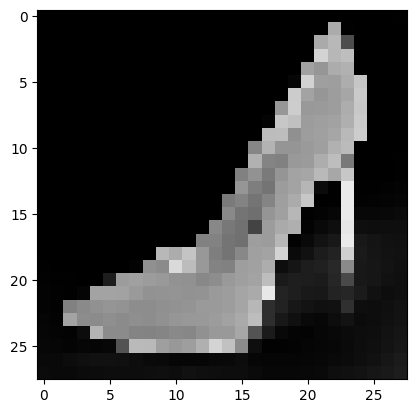

In [ ]:
image = cv2.imread('C:/Users/User/Desktop/shoe2.png', 0) # Преобразование изображения в оттенки серого при считывании
image = cv2.resize(image, (28, 28)) # Изменение разрешения изображения
image = cv2.bitwise_not(image) # Инверсия цветов (если в оригинале цифра написана черным цветом на белом фоне)
orig = image
image = image.reshape(-1, 28, 28, 1) # Приводим изображение из вида (28,28) в вид (1, 28, 28, 1)

plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
preds = model.predict(image)
print(preds)

1/1 [==============================] - 0s 26ms/step
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]


In [ ]:
i = preds.argmax(axis=1)[0]
print(f"Загружено изображение: {labels[i]}")

Загружено изображение: Sandal


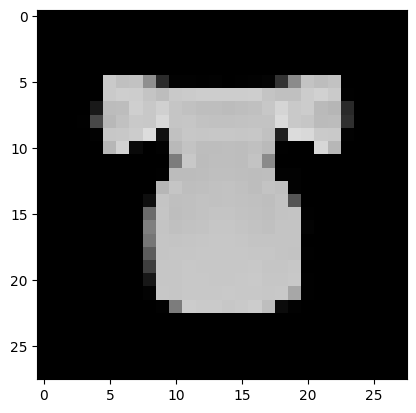

In [ ]:
image = cv2.imread('C:/Users/User/Desktop/dress.jfif', 0) # Преобразование изображения в оттенки серого при считывании
image = cv2.resize(image, (28, 28)) # Изменение разрешения изображения
image = cv2.bitwise_not(image) # Инверсия цветов (если в оригинале цифра написана черным цветом на белом фоне)
orig = image
image = image.reshape(-1, 28, 28, 1) # Приводим изображение из вида (28,28) в вид (1, 28, 28, 1)

plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
preds = model.predict(image)
print(preds)

1/1 [==============================] - 0s 23ms/step
[[1.8696414e-32 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]]


In [ ]:
i = preds.argmax(axis=1)[0]
print(f"Загружено изображение: {labels[i]}")

Загружено изображение: Dress


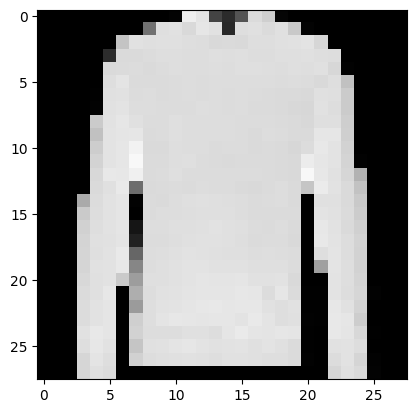

In [ ]:
image = cv2.imread('C:/Users/User/Desktop/sweetshirt.jpg', 0) # Преобразование изображения в оттенки серого при считывании
image = cv2.resize(image, (28, 28)) # Изменение разрешения изображения
image = cv2.bitwise_not(image) # Инверсия цветов (если в оригинале цифра написана черным цветом на белом фоне)
orig = image
image = image.reshape(-1, 28, 28, 1) # Приводим изображение из вида (28,28) в вид (1, 28, 28, 1)

plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
preds = model.predict(image)
print(preds)

1/1 [==============================] - 0s 22ms/step
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]


In [ ]:
i = preds.argmax(axis=1)[0]
print(f"Загружено изображение: {labels[i]}")

Загружено изображение: Pullover


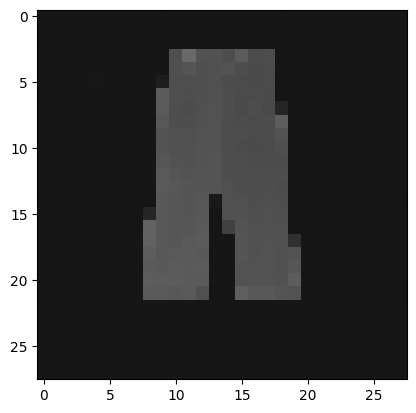

In [ ]:
image = cv2.imread('C:/Users/User/Desktop/trouser.png', 0) # Преобразование изображения в оттенки серого при считывании
image = cv2.resize(image, (28, 28)) # Изменение разрешения изображения
image = cv2.bitwise_not(image) # Инверсия цветов (если в оригинале цифра написана черным цветом на белом фоне)
orig = image
image = image.reshape(-1, 28, 28, 1) # Приводим изображение из вида (28,28) в вид (1, 28, 28, 1)

plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
preds = model.predict(image)
print(preds)

1/1 [==============================] - 0s 23ms/step
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]


In [ ]:
i = preds.argmax(axis=1)[0]
print(f"Загружено изображение: {labels[i]}")

Загружено изображение: Trouser


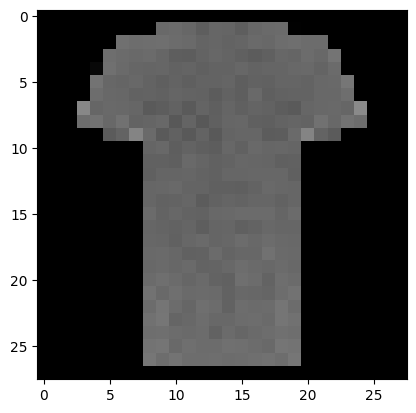

In [ ]:
image = cv2.imread('C:/Users/User/Desktop/t-shirt.jpg', 0) # Преобразование изображения в оттенки серого при считывании
image = cv2.resize(image, (28, 28)) # Изменение разрешения изображения
image = cv2.bitwise_not(image) # Инверсия цветов (если в оригинале цифра написана черным цветом на белом фоне)
orig = image
image = image.reshape(-1, 28, 28, 1) # Приводим изображение из вида (28,28) в вид (1, 28, 28, 1)

plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
preds = model.predict(image)
print(preds)

1/1 [==============================] - 0s 25ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


In [ ]:
i = preds.argmax(axis=1)[0]
print(f"Загружено изображение: {labels[i]} ")

Загружено изображение: T-shirt/top 


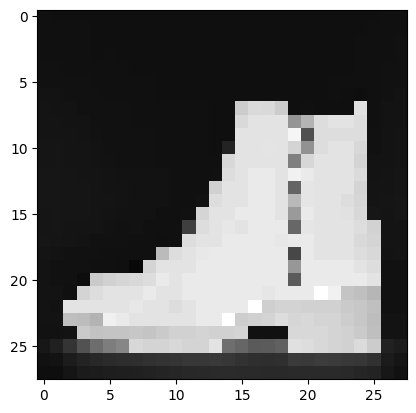

In [ ]:
image = cv2.imread('C:/Users/User/Desktop/boot.png', 0) # Преобразование изображения в оттенки серого при считывании
image = cv2.resize(image, (28, 28)) # Изменение разрешения изображения
image = cv2.bitwise_not(image) # Инверсия цветов (если в оригинале цифра написана черным цветом на белом фоне)
orig = image
image = image.reshape(-1, 28, 28, 1) # Приводим изображение из вида (28,28) в вид (1, 28, 28, 1)

plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
preds = model.predict(image)
print(preds)

1/1 [==============================] - 0s 24ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]


In [ ]:
i = preds.argmax(axis=1)[0]
print(f"Загружено изображение: {labels[i]} ")

Загружено изображение: Ankle boot 


# Задание №2. Использование глубокой сверточной нейронной сети для классификации изображений по своему датасету

## 2.1.  Используя датасет, собранный для предыдущей работы, разработайте и обучите **свою** модель глубокой  **сверточной** нейронной сети для классификации изображений







In [ ]:
# Подключаем необходимые модули и пакеты
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from keras.models import Sequential
from keras.layers.core import Dense
from keras.optimizers import SGD
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import random
import pickle
import cv2
import os
from keras import models  

In [ ]:
imagePaths = sorted(list(paths.list_images("C:/Users/User/Documents/GitHub/NeuralNetworks")))

random.shuffle(imagePaths)

In [ ]:
data = []
labels = []

In [ ]:
# цикл по изображениям
for imagePath in imagePaths:
	
	image = cv2.imread(imagePath) # загружаем изображение
	image = cv2.resize(image, (64, 64)) # меняем его разрешение на 32x32 пикселей (без учета соотношения сторон),
																								# сглаживаем его в 32x32x3=3072 пикселей
	data.append(image) # добавляем в список

	label = imagePath.split(os.path.sep)[-2] 	# извлекаем метку класса из пути к изображению (метка класса зависит от имени папки)
	labels.append(label) # обновляем список меток

In [ ]:
# масштабируем интенсивности пикселей в диапазон [0, 1] (Нормализация данных)
data = np.array(data, dtype="float") / 255.0
labels = np.array(labels)

In [ ]:
# разбиваем данные на обучающую и тестовую выборки, используя 75%
# данных для обучения и оставшиеся 25% для тестирования
(trainX, testX, trainY, testY) = train_test_split(data,
	labels, test_size=0.25, random_state=42)

In [ ]:
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)

#trainX = np.expand_dims(trainX, -1)
#testX = np.expand_dims(testX, -1)

print('Train: X = ', trainX.shape)
print('Test: X = ', testX.shape)

Train: X =  (4500, 64, 64, 3)
Test: X =  (1500, 64, 64, 3)


In [ ]:
model = keras.Sequential([
    Conv2D(32, (2,2), padding='same', activation='relu', input_shape=(64,64,3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(128, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(3,  activation='softmax')
])

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 64, 64, 32)        416       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 32, 32, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 32, 32, 64)        18496     
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 16, 16, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 16, 16, 128)       73856     
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 8, 8, 128)       

In [ ]:
from keras.optimizers import Adam

opt = Adam(lr = 0.000001)

C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\optimizers\legacy\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
EPOCH = 3

model.compile(optimizer='adam',
             loss='categorical_crossentropy',
             metrics=['accuracy'])


his = model.fit(trainX, trainY, batch_size=16, epochs=EPOCH, validation_split=0.2)

model.evaluate(testX, testY)

Epoch 1/3
225/225 [==============================] - 27s 114ms/step - loss: 0.8202 - accuracy: 0.6322 - val_loss: 0.7714 - val_accuracy: 0.6667
Epoch 2/3
225/225 [==============================] - 25s 112ms/step - loss: 0.5606 - accuracy: 0.7767 - val_loss: 0.4703 - val_accuracy: 0.8156
Epoch 3/3
47/47 [==============================] - 2s 38ms/step - loss: 0.5330 - accuracy: 0.7727


[0.5330097079277039, 0.7726666927337646]

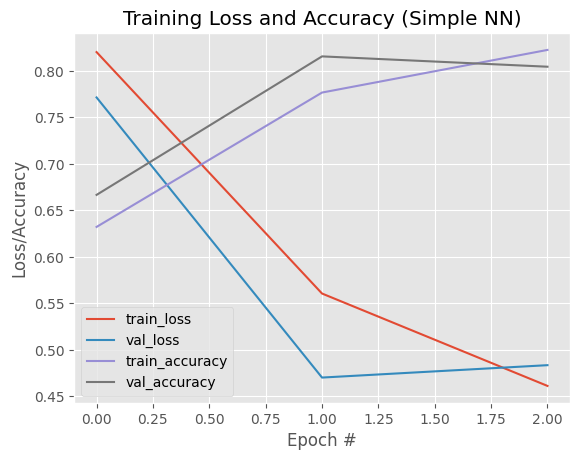

In [ ]:
N = np.arange(0, EPOCH)
plt.style.use("ggplot")
plt.figure()
plt.plot(N, his.history["loss"], label="train_loss")
plt.plot(N, his.history["val_loss"], label="val_loss")
plt.plot(N, his.history["accuracy"], label="train_accuracy")
plt.plot(N, his.history["val_accuracy"], label="val_accuracy")
plt.title("Training Loss and Accuracy (Simple NN)")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

In [ ]:
model.save("model3.h5", save_format="h5")
f = open("label_bin", "wb")
f.write(pickle.dumps(lb))
f.close()

In [ ]:
image = cv2.imread('C:/Users/User/Desktop/datatest/Cow/Cow-Test (25).jpeg')
output = image.copy()
image = cv2.resize(image, (64, 64))
image = image.reshape(-1, 64, 64, 3)

In [ ]:
image = image.astype("float") / 255.0

In [ ]:
model = models.load_model("model3.h5")
lb = pickle.loads(open("label_bin", "rb").read())

In [ ]:
preds = model.predict(image)
print(preds)

1/1 [==============================] - 0s 77ms/step
[[0.04569158 0.94798124 0.00632724]]


In [ ]:
i = preds.argmax(axis=1)[0]
label = lb.classes_[i]

In [ ]:
text = "{}: {:.2f}%".format(label, preds[0][i] * 100)
cv2.putText(output, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7,
	(0, 0, 255), 2)

array([[[231, 210, 212],
        [231, 210, 212],
        [231, 210, 212],
        ...,
        [231, 190, 188],
        [231, 190, 188],
        [232, 191, 189]],

       [[231, 210, 212],
        [231, 210, 212],
        [232, 211, 213],
        ...,
        [231, 190, 188],
        [231, 190, 188],
        [232, 191, 189]],

       [[231, 210, 212],
        [232, 211, 213],
        [232, 211, 213],
        ...,
        [231, 190, 188],
        [231, 190, 188],
        [231, 190, 188]],

       ...,

       [[ 64, 148, 130],
        [ 55, 141, 123],
        [ 55, 141, 123],
        ...,
        [ 48, 129,  90],
        [ 46, 127,  88],
        [ 46, 127,  88]],

       [[ 53, 136, 121],
        [ 42, 128, 110],
        [ 35, 121, 103],
        ...,
        [ 32, 115,  76],
        [ 29, 112,  73],
        [ 49, 132,  93]],

       [[  0,  81,  66],
        [ 28, 113,  98],
        [ 58, 144, 126],
        ...,
        [ 42, 125,  86],
        [  8,  91,  52],
        [ 37, 120,  81]]

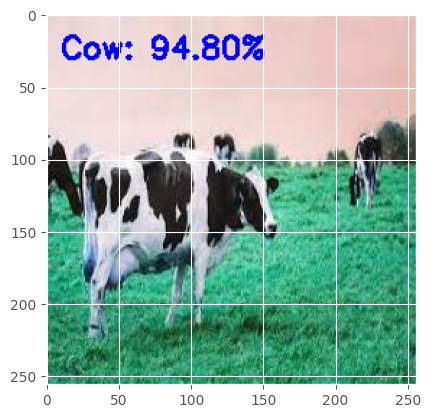

In [ ]:
plt.imshow(output)
plt.show()

## 2.2.   Ознакомьтесь с современными архитектурами сверточных нейронных сетей: [см. ссылку](https://medium.com/aiguys/how-cnn-architectures-evolved-c53d3819fef8). На основе рассмотренных архитектур, реализуйте (частично повторяя основные паттерны проектирования) и обучите модель сверточной нейронной сети. Укажите архитектуру, которой Вы "вдохновились"

В качестве основы для данной нейронной сети была выбрана архитектура MiniVGGNet.

In [ ]:
# Подключаем необходимые модули и пакеты
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from keras.models import Sequential
from keras.layers.core import Dense
from keras.optimizers import SGD
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import random
import pickle
import cv2
import os

In [ ]:
imagePaths = sorted(list(paths.list_images("C:/Users/User/Documents/GitHub/NeuralNetworks")))

random.shuffle(imagePaths)

In [ ]:
data = []
labels = []

In [ ]:
# цикл по изображениям
for imagePath in imagePaths:
	
	image = cv2.imread(imagePath) # загружаем изображение
	image = cv2.resize(image, (64, 64)) # меняем его разрешение на 32x32 пикселей (без учета соотношения сторон),
																								# сглаживаем его в 32x32x3=3072 пикселей
	data.append(image) # добавляем в список

	label = imagePath.split(os.path.sep)[-2] 	# извлекаем метку класса из пути к изображению (метка класса зависит от имени папки)
	labels.append(label) # обновляем список меток

In [ ]:
# масштабируем интенсивности пикселей в диапазон [0, 1] (Нормализация данных)
data = np.array(data, dtype="float") / 255.0
labels = np.array(labels)

In [ ]:
# разбиваем данные на обучающую и тестовую выборки, используя 75%
# данных для обучения и оставшиеся 25% для тестирования
(trainX, testX, trainY, testY) = train_test_split(data,
	labels, test_size=0.25, random_state=42)

In [ ]:
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)

#trainX = np.expand_dims(trainX, -1)
#testX = np.expand_dims(testX, -1)

print('Train: X = ', trainX.shape)
print('Test: X = ', testX.shape)

Train: X =  (4500, 64, 64, 3)
Test: X =  (1500, 64, 64, 3)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense

In [ ]:
model = keras.Sequential()

In [ ]:
model.add(Conv2D(32, (3, 3), padding="same", input_shape=(64,64,3)))
model.add(Activation("relu"))
model.add(Conv2D(32, (3, 3), padding="same"))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), padding="same"))
model.add(Activation("relu"))
model.add(Conv2D(64, (3, 3), padding="same"))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(512))
model.add(Activation("relu"))
model.add(Dense(3))
model.add(Activation("softmax"))

model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_31 (Conv2D)          (None, 64, 64, 32)        896       
                                                                 
 activation_42 (Activation)  (None, 64, 64, 32)        0         
                                                                 
 conv2d_32 (Conv2D)          (None, 64, 64, 32)        9248      
                                                                 
 activation_43 (Activation)  (None, 64, 64, 32)        0         
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 32, 32, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_33 (Conv2D)          (None, 32, 32, 64)        18496     
                                                      

In [ ]:
from keras.optimizers import Adam

opt = Adam(lr = 0.00001)

EPOCH = 5

model.compile(optimizer='adam',
             loss='categorical_crossentropy',
             metrics=['accuracy'])


his = model.fit(trainX, trainY, batch_size=32, epochs=EPOCH, validation_split=0.03)

model.evaluate(testX, testY)

C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\optimizers\legacy\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/5
137/137 [==============================] - 63s 437ms/step - loss: 0.8684 - accuracy: 0.6073 - val_loss: 0.6669 - val_accuracy: 0.7185
Epoch 2/5
137/137 [==============================] - 60s 440ms/step - loss: 0.6012 - accuracy: 0.7562 - val_loss: 0.4751 - val_accuracy: 0.8000
Epoch 3/5
137/137 [==============================] - 62s 452ms/step - loss: 0.4567 - accuracy: 0.8202 - val_loss: 0.4110 - val_accuracy: 0.8222
Epoch 4/5
137/137 [==============================] - 60s 441ms/step - loss: 0.3818 - accuracy: 0.8525 - val_loss: 0.3730 - val_accuracy: 0.8444
Epoch 5/5
47/47 [==============================] - 4s 93ms/step - loss: 0.4534 - accuracy: 0.8427


[0.45342060923576355, 0.8426666855812073]

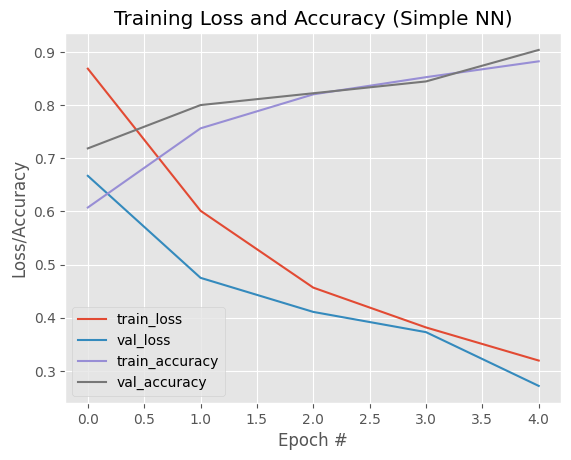

In [ ]:
N = np.arange(0, EPOCH)
plt.style.use("ggplot")
plt.figure()
plt.plot(N, his.history["loss"], label="train_loss")
plt.plot(N, his.history["val_loss"], label="val_loss")
plt.plot(N, his.history["accuracy"], label="train_accuracy")
plt.plot(N, his.history["val_accuracy"], label="val_accuracy")
plt.title("Training Loss and Accuracy (Simple NN)")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

In [ ]:
model.save("model4.h5", save_format="h5")
f = open("label_bin", "wb")
f.write(pickle.dumps(lb))
f.close()

In [ ]:
image = cv2.imread('C:/Users/User/Desktop/datatest/Cow/Cow-Test (25).jpeg')
output = image.copy()
image = cv2.resize(image, (64, 64))
image = image.reshape(-1, 64, 64, 3)

In [ ]:
image = image.astype("float") / 255.0

In [ ]:
model = models.load_model("model4.h5")
lb = pickle.loads(open("label_bin", "rb").read())

In [ ]:
preds = model.predict(image)
print(preds)

1/1 [==============================] - 0s 92ms/step
[[2.70707358e-04 9.99618292e-01 1.10988265e-04]]


In [ ]:
i = preds.argmax(axis=1)[0]
label = lb.classes_[i]

In [ ]:
text = "{}: {:.2f}%".format(label, preds[0][i] * 100)
cv2.putText(output, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7,
	(0, 0, 255), 2)

array([[[231, 210, 212],
        [231, 210, 212],
        [231, 210, 212],
        ...,
        [231, 190, 188],
        [231, 190, 188],
        [232, 191, 189]],

       [[231, 210, 212],
        [231, 210, 212],
        [232, 211, 213],
        ...,
        [231, 190, 188],
        [231, 190, 188],
        [232, 191, 189]],

       [[231, 210, 212],
        [232, 211, 213],
        [232, 211, 213],
        ...,
        [231, 190, 188],
        [231, 190, 188],
        [231, 190, 188]],

       ...,

       [[ 64, 148, 130],
        [ 55, 141, 123],
        [ 55, 141, 123],
        ...,
        [ 48, 129,  90],
        [ 46, 127,  88],
        [ 46, 127,  88]],

       [[ 53, 136, 121],
        [ 42, 128, 110],
        [ 35, 121, 103],
        ...,
        [ 32, 115,  76],
        [ 29, 112,  73],
        [ 49, 132,  93]],

       [[  0,  81,  66],
        [ 28, 113,  98],
        [ 58, 144, 126],
        ...,
        [ 42, 125,  86],
        [  8,  91,  52],
        [ 37, 120,  81]]

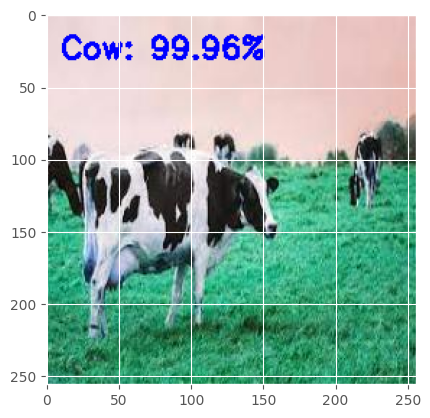

In [ ]:
plt.imshow(output)
plt.show()

## 2.3. Сравните между собой точность всех трёх моделей, подавая на вход одинаковые изображения (15 разных изображений). Сравните предсказания каждой из моделей и сделайте выводы

### Тигры

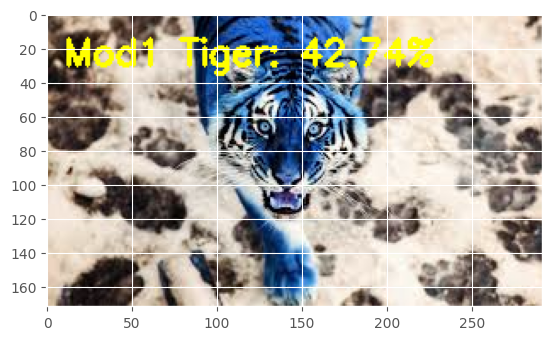

In [ ]:
plt.imshow(output)
plt.show()

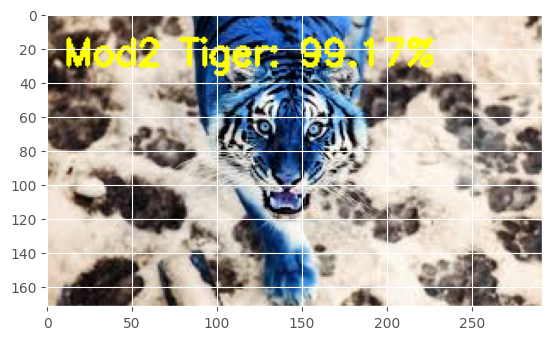

In [ ]:
plt.imshow(output)
plt.show()

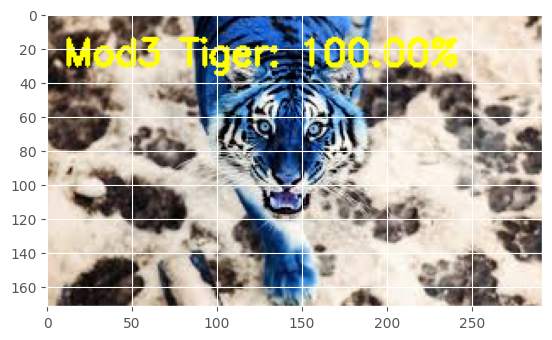

In [ ]:
plt.imshow(output)
plt.show()

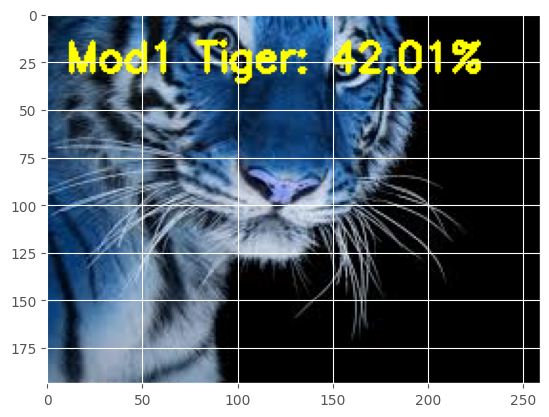

In [ ]:
plt.imshow(output)
plt.show()

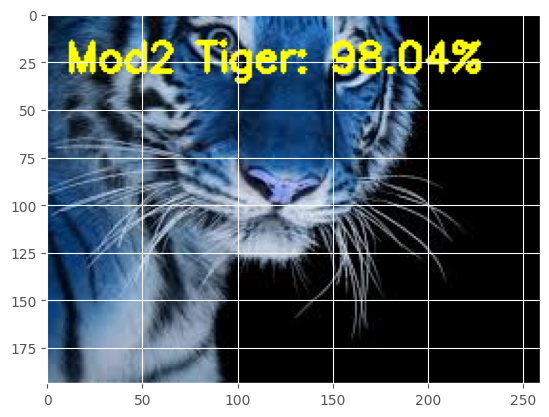

In [ ]:
plt.imshow(output)
plt.show()

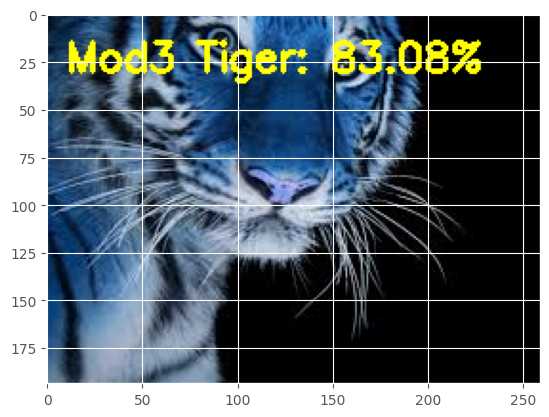

In [ ]:
plt.imshow(output)
plt.show()

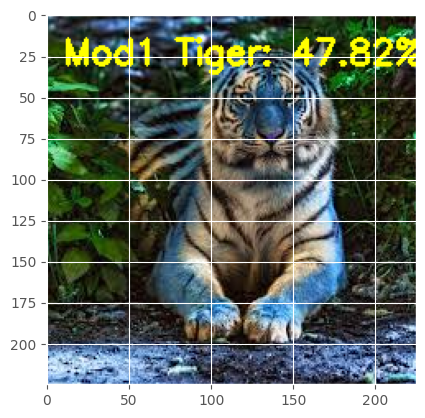

In [ ]:
plt.imshow(output)
plt.show()

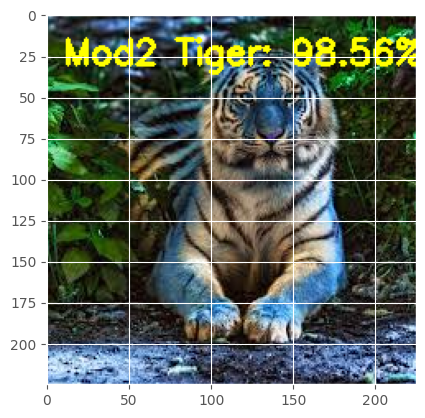

In [ ]:
plt.imshow(output)
plt.show()

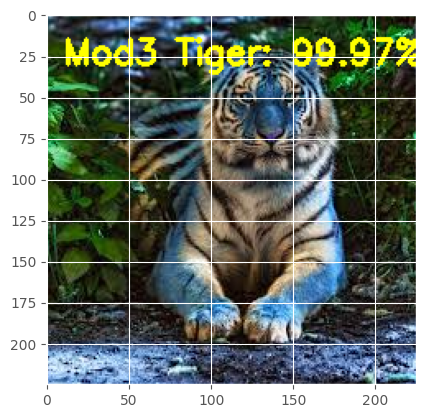

In [ ]:
plt.imshow(output)
plt.show()

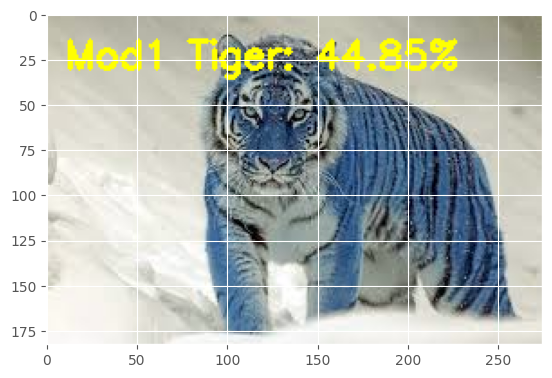

In [ ]:
plt.imshow(output)
plt.show()

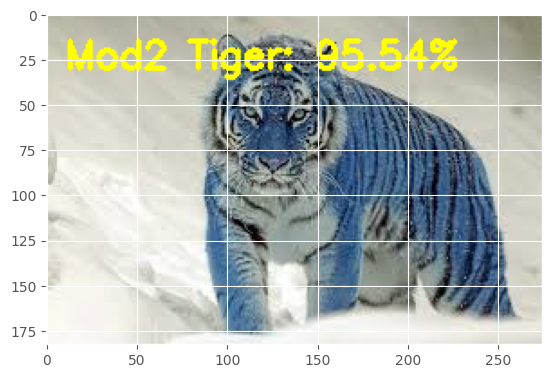

In [ ]:
plt.imshow(output)
plt.show()

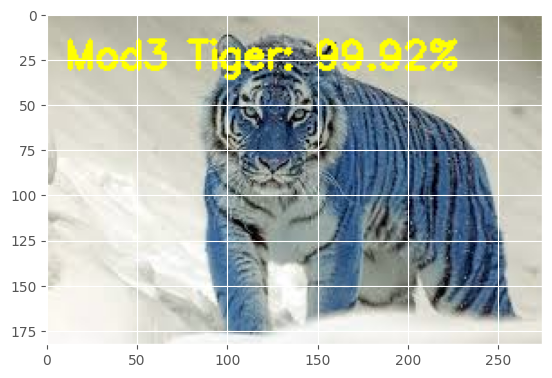

In [ ]:
plt.imshow(output)
plt.show()

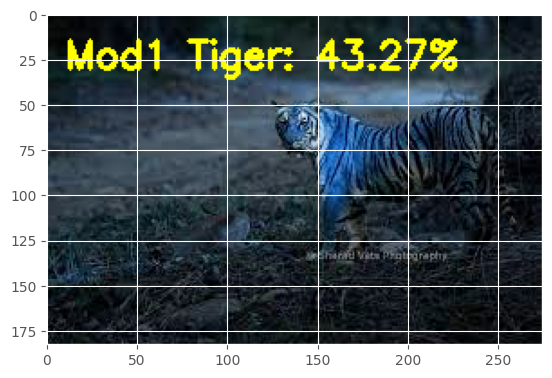

In [ ]:
plt.imshow(output)
plt.show()

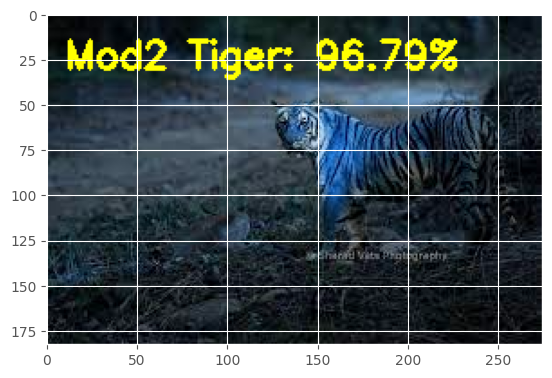

In [ ]:
plt.imshow(output)
plt.show()

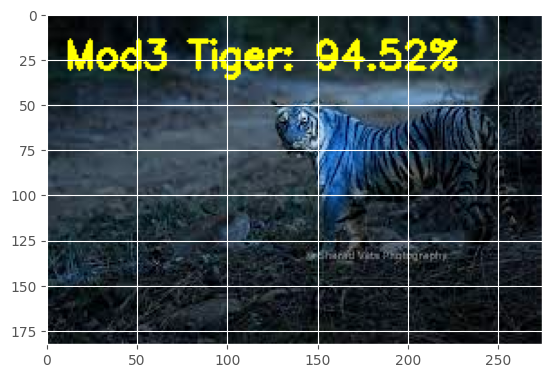

In [ ]:
plt.imshow(output)
plt.show()

### Бабочки


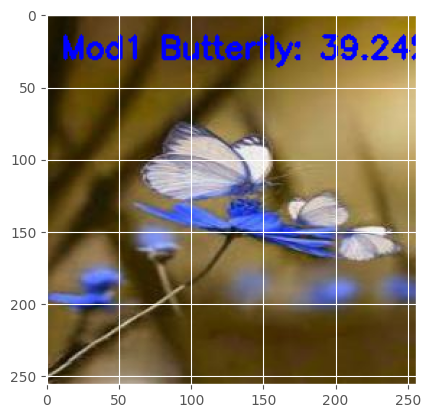

In [ ]:
plt.imshow(output)
plt.show()

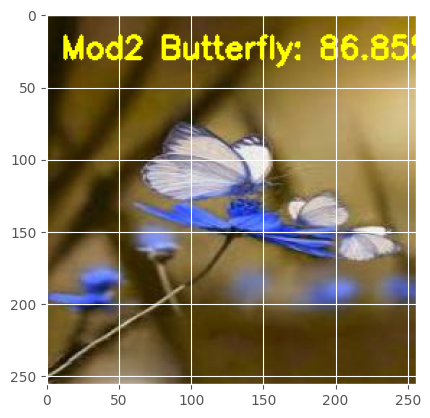

In [ ]:
plt.imshow(output)
plt.show()

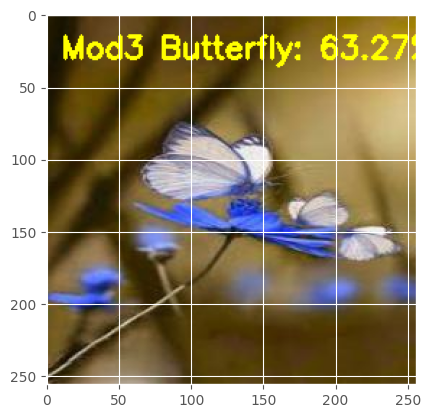

In [ ]:
plt.imshow(output)
plt.show()

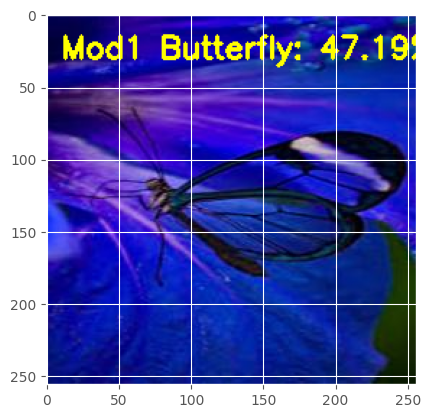

In [ ]:
plt.imshow(output)
plt.show()

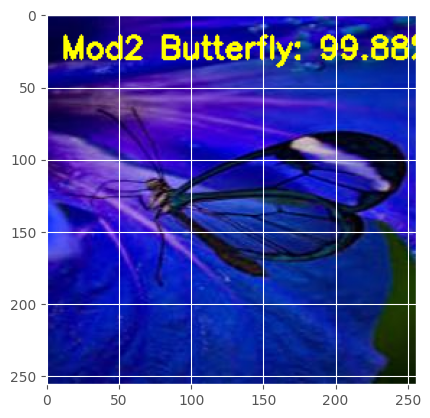

In [ ]:
plt.imshow(output)
plt.show()

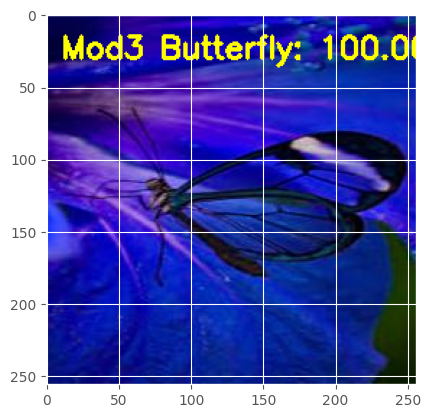

In [ ]:
plt.imshow(output)
plt.show()

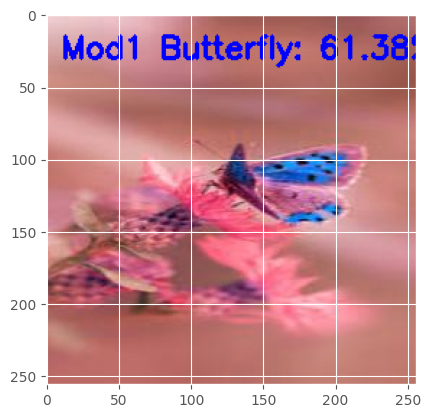

In [ ]:
plt.imshow(output)
plt.show()

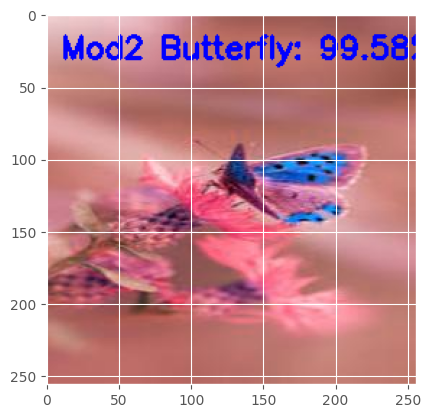

In [ ]:
plt.imshow(output)
plt.show()

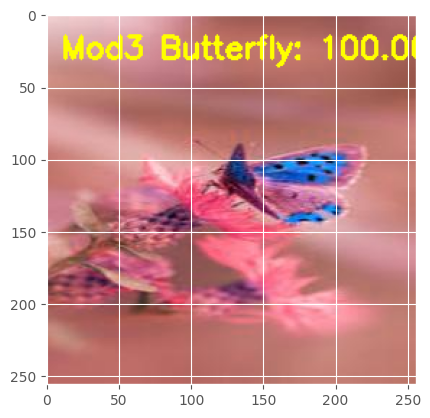

In [ ]:
plt.imshow(output)
plt.show()

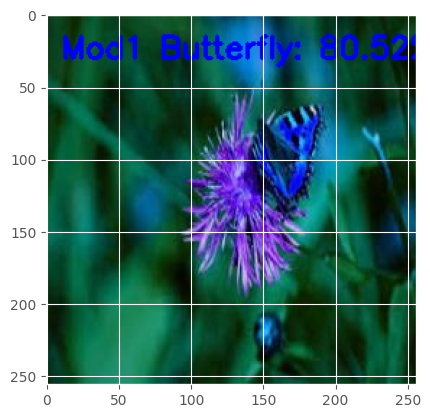

In [ ]:
plt.imshow(output)
plt.show()

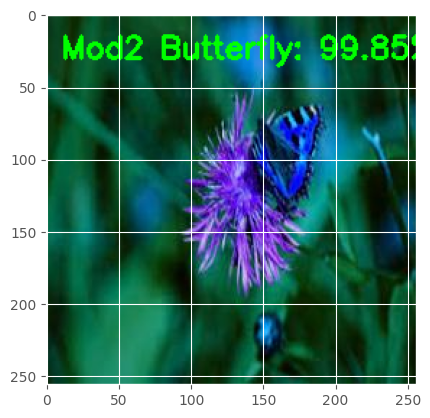

In [ ]:
plt.imshow(output)
plt.show()

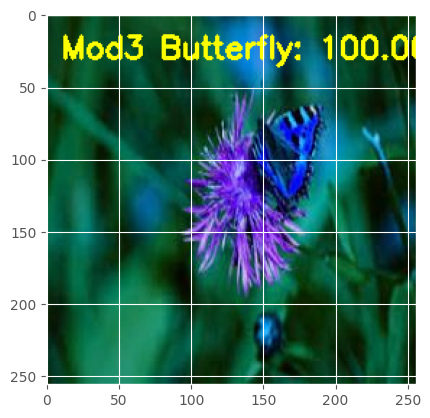

In [ ]:
plt.imshow(output)
plt.show()

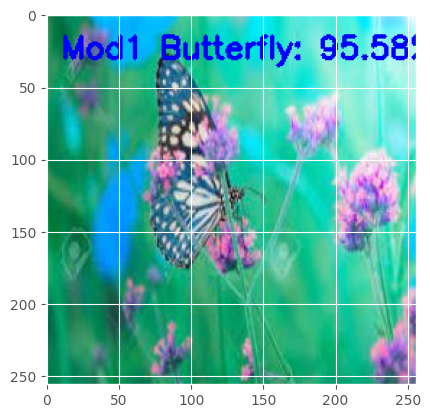

In [ ]:
plt.imshow(output)
plt.show()

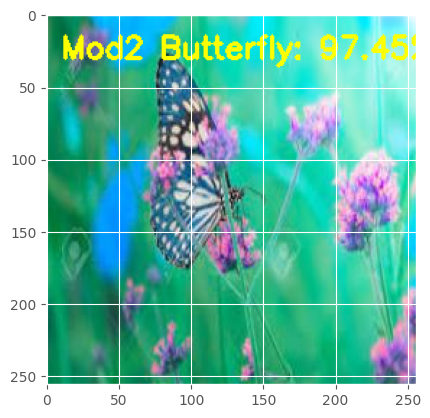

In [ ]:
plt.imshow(output)
plt.show()

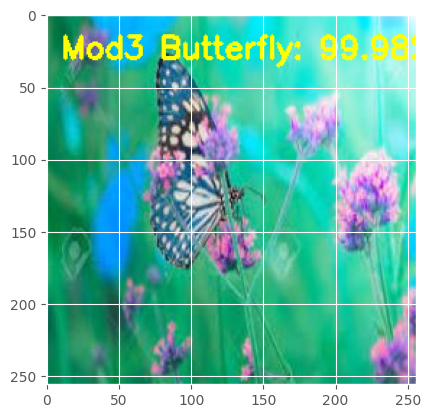

In [ ]:
plt.imshow(output)
plt.show()

### Коровы

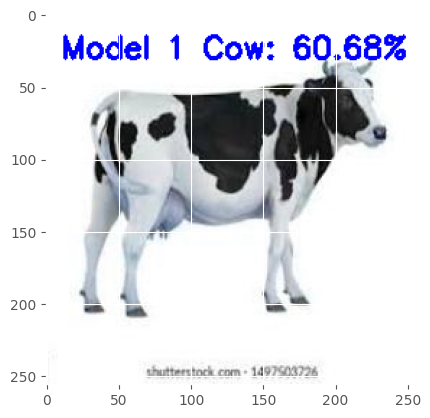

In [ ]:
plt.imshow(output)
plt.show()

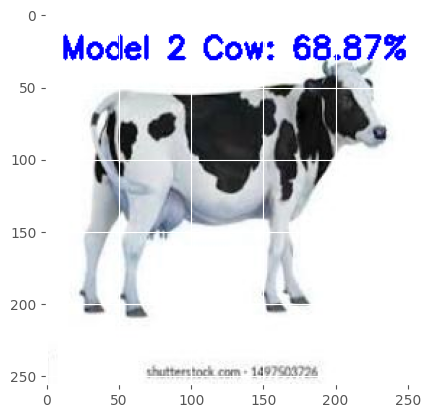

In [ ]:
plt.imshow(output)
plt.show()

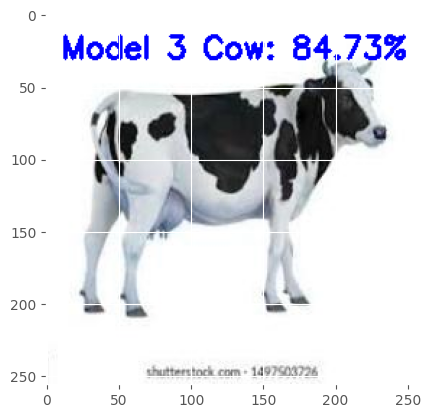

In [ ]:
plt.imshow(output)
plt.show()

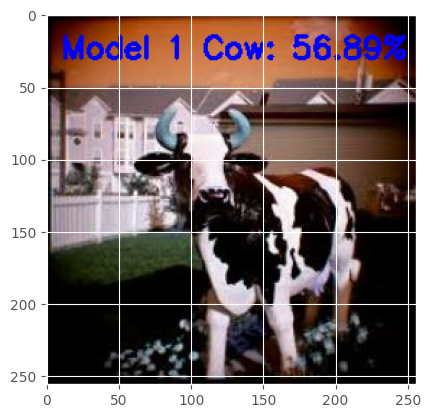

In [ ]:
plt.imshow(output)
plt.show()

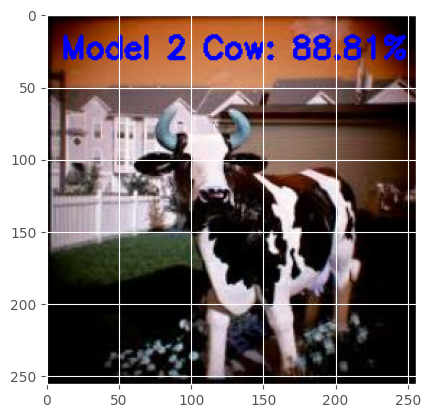

In [ ]:
plt.imshow(output)
plt.show()

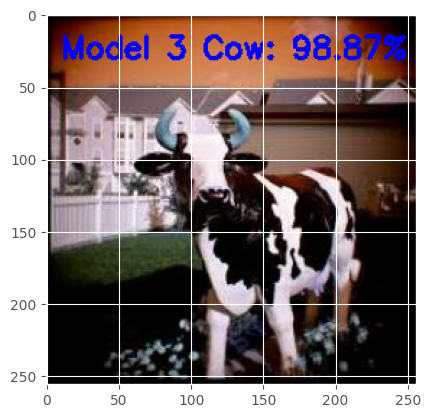

In [ ]:
plt.imshow(output)
plt.show()

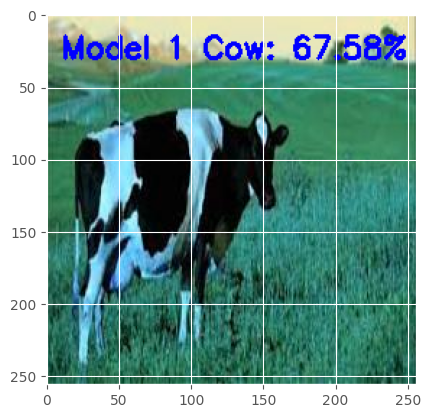

In [ ]:
plt.imshow(output)
plt.show()

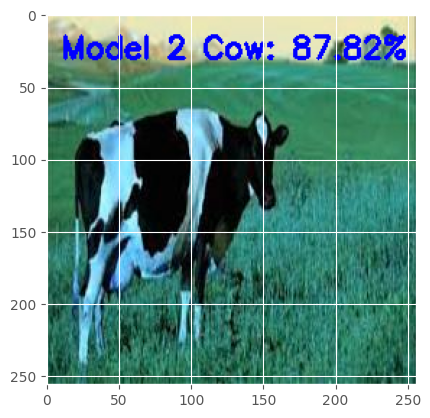

In [ ]:
plt.imshow(output)
plt.show()

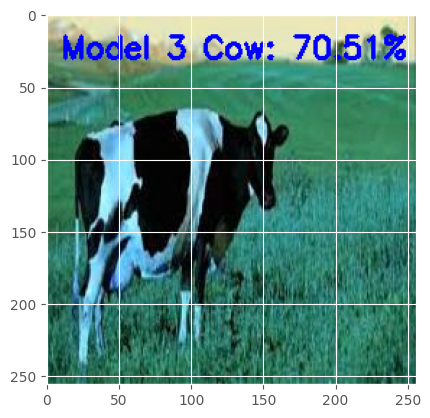

In [ ]:
plt.imshow(output)
plt.show()

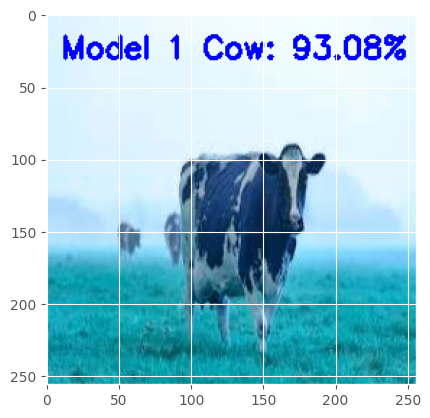

In [ ]:
plt.imshow(output)
plt.show()

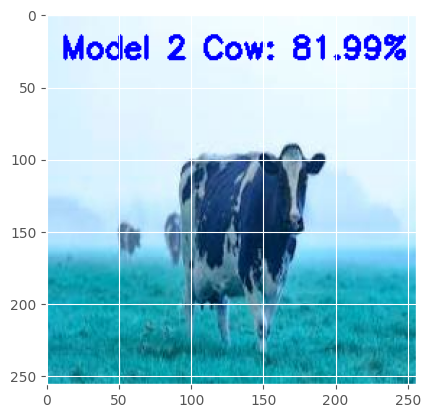

In [ ]:
plt.imshow(output)
plt.show()

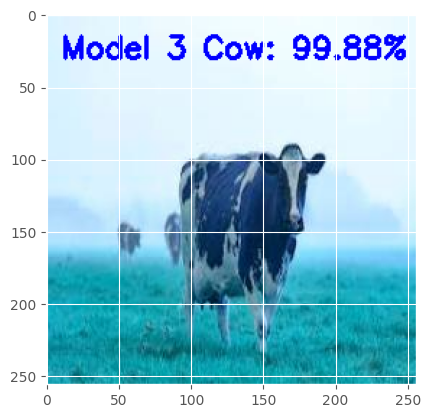

In [ ]:
plt.imshow(output)
plt.show()

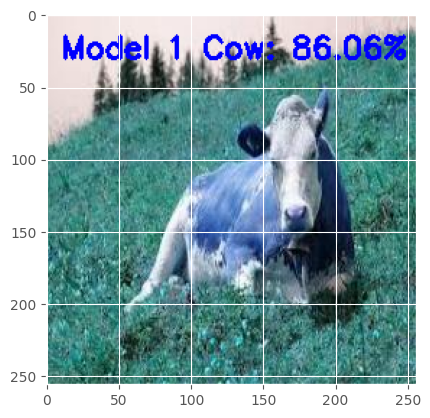

In [ ]:
plt.imshow(output)
plt.show()

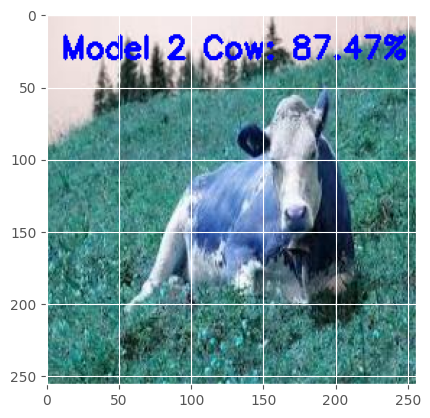

In [ ]:
plt.imshow(output)
plt.show()

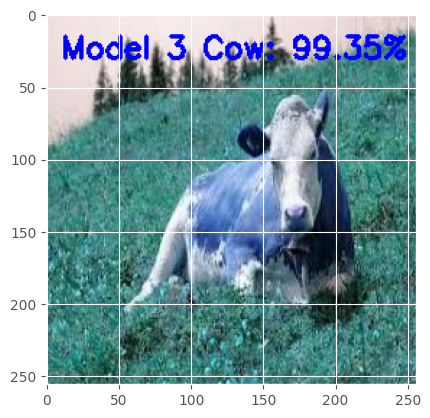

In [ ]:
plt.imshow(output)
plt.show()

По итогу тестирования моделей на тестовых пользовательских изображениях можно сделать вывод, что третья модель предсказывает класс изображения лучше других моделей, изредка уступая второй модели. В целом все модели достаточно успешно справляются с поставленной задачей.

# Задание №3*. Использование глубокой сверточной нейронной сети для восстановления изображения

## 3.1. Работа с данными

Будем работать с набором данным `fetch_olivetti_faces` из `sklearn`.

### 3.1.1. Переведите векторы в настоящие изображения из двух размерностей

In [33]:
from sklearn.datasets import fetch_olivetti_faces
from sklearn.model_selection import train_test_split

data, _ = fetch_olivetti_faces(return_X_y=True)
train, test = train_test_split(data, test_size=0.2, random_state=4)

In [34]:
train.shape

(320, 4096)

Сейчас изображение - это вектор, имеющий размерность 4096.

In [35]:
# Ваш код здесь

train = train.reshape((train.shape[0], 64, 64))
test = test.reshape((test.shape[0], 64, 64))

train.shape

(320, 64, 64)

### 3.1.2. Отрисуйте несколько примеров

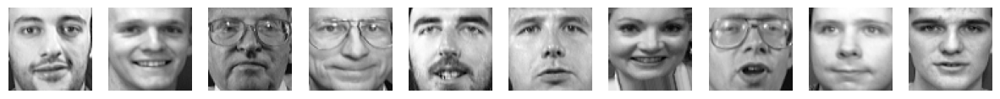

In [36]:
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 10, figsize=(15, 10))

for i in range(10):
    ax[i].imshow(train[i], cmap='gray')
    ax[i].axis('off')

Поделим данные на X и y, где X - это верхняя часть лица человека, на этом модель будет обучаться, а y - это нижняя часть лица человека - её будем предсказывать.

In [37]:
n_pixels = train.shape[1]

# Upper half of the faces
X_train = train[:, :(n_pixels + 1) // 2, :]
# Lower half of the faces
y_train = train[:, n_pixels // 2:, :]


X_test = test[:, :(n_pixels + 1) // 2, :]
y_test = test[:, n_pixels // 2:, :]

In [38]:
X_train.shape

(320, 32, 64)

Вот один пример обучающей пары.

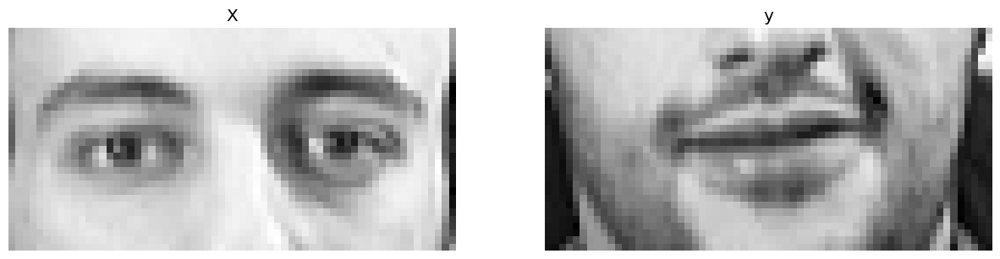

In [39]:
import matplotlib.pyplot as plt

idx = 0

fig, ax = plt.subplots(1, 2, figsize=(15, 8))
ax[0].imshow(X_train[idx], cmap='gray')
ax[0].set_title('X')
ax[1].imshow(y_train[idx], cmap='gray')
ax[1].set_title('y')
ax[0].axis('off')
ax[1].axis('off')

plt.show()

### 3.1.3. Измените размерность y
Остается только изменить размерность y, т.к. сейчас $y$ - картинка 32x64, а выход нейронной сети у нас будет одномерный и равный 32 * 64 = 2048. 

In [40]:
y_train_n = y_train.reshape(y_train.shape[0], 32 * 64)
y_test_n = y_test.reshape(y_test.shape[0], 32 * 64)

X_train.shape, y_train_n.shape

((320, 32, 64), (320, 2048))

## 3.2. Создайте архитектуру для этой задачи

In [41]:
from keras import optimizers
from tensorflow import keras
from tensorflow.keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D

model = keras.Sequential([
    Conv2D(64, (5,5), padding='same', activation='relu', input_shape=(32, 64, 1)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(128, (5,5), padding='same', activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(256, (5,5), padding='same', activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Flatten(),
    Dense(4096, activation='relu'),
    Dense(2048,  activation='relu')
])


model.summary()




Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 32, 64, 64)        1664      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 16, 32, 64)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 16, 32, 128)       204928    
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 8, 16, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 8, 16, 256)        819456    
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 4, 8, 256)       

## 3.3. Скомпилируйте сеть

Подберите нужную функцию потерь и метрику. Оптимизатор можете использовать 'adam'

In [42]:
optimizer = optimizers.Adam(0.001)

EPOCH = 1000

model.compile(optimizer=optimizer,
             loss='mse',
             metrics=['mae'])

X_train.shape, y_train_n.shape


((320, 32, 64), (320, 2048))

## 3.4. Обучите нейросеть

Выберите нужное количество эпох.


In [43]:
his = model.fit(X_train, y_train_n, batch_size=1000, epochs=EPOCH, validation_split=0.2)

Epoch 1/1000
1/1 [==============================] - 1s 841ms/step - loss: 0.2698 - mae: 0.4922 - val_loss: 0.5440 - val_mae: 0.6359
Epoch 2/1000
1/1 [==============================] - 0s 133ms/step - loss: 0.5354 - mae: 0.6309 - val_loss: 0.2568 - val_mae: 0.4788
Epoch 3/1000
1/1 [==============================] - 0s 126ms/step - loss: 0.2496 - mae: 0.4713 - val_loss: 0.2812 - val_mae: 0.5039
Epoch 4/1000
1/1 [==============================] - 0s 104ms/step - loss: 0.2735 - mae: 0.4962 - val_loss: 0.2823 - val_mae: 0.5050
Epoch 5/1000
1/1 [==============================] - 0s 103ms/step - loss: 0.2746 - mae: 0.4973 - val_loss: 0.2803 - val_mae: 0.5030
Epoch 6/1000
1/1 [==============================] - 0s 102ms/step - loss: 0.2725 - mae: 0.4953 - val_loss: 0.2739 - val_mae: 0.4967
Epoch 7/1000
1/1 [==============================] - 0s 106ms/step - loss: 0.2663 - mae: 0.4890 - val_loss: 0.2542 - val_mae: 0.4764
Epoch 8/1000
1/1 [==============================] - 0s 102ms/step - loss: 0.

In [44]:
model.evaluate(X_test, y_test_n)

3/3 [==============================] - 0s 11ms/step - loss: 0.0136 - mae: 0.0814


[0.013603463768959045, 0.0814230665564537]

## 3.5. Сделайте предсказания на тестовых данных

In [45]:
import numpy as np
a = []
a.append(model.predict(X_test).reshape(80, 32, 64))
print(np.asarray(a).shape)

3/3 [==============================] - 0s 7ms/step
(1, 80, 32, 64)


## 3.6. Отрисуйте все предсказания

Отрисуйте все предсказания.

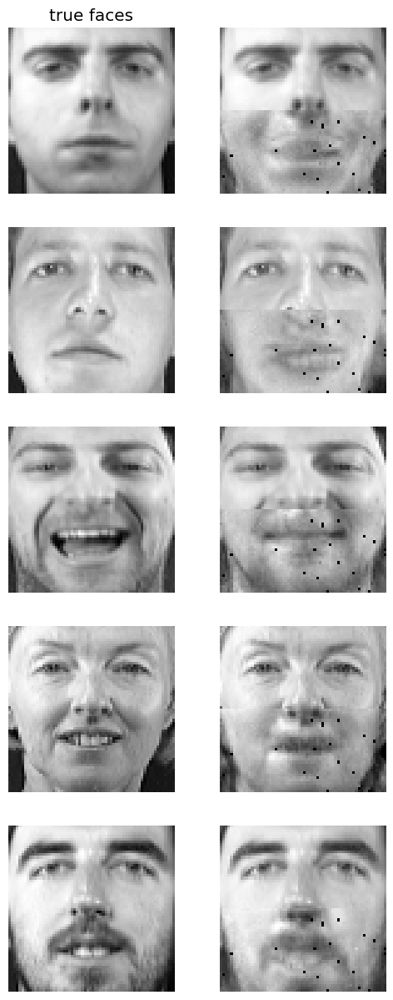

In [48]:
n_faces = 5
n_cols = 2
image_shape = (64, 64)
plt.figure(figsize=(3 * n_cols, 3 * n_faces))


for i in range(5):
    true_face = np.vstack((X_test[i], y_test[i]))

    if i:
        sub = plt.subplot(n_faces, n_cols, i * n_cols + 1)
    else:
        sub = plt.subplot(n_faces, n_cols, i * n_cols + 1, title="true faces")

    sub.axis("off")
    sub.imshow(
        true_face.reshape(image_shape), cmap=plt.cm.gray, interpolation="nearest"
    )

    completed_face = np.vstack((X_test[i], np.asarray(a[0][i])))

    if i:
        sub = plt.subplot(n_faces, n_cols, i * n_cols + 2)

    else:
        sub = plt.subplot(n_faces, n_cols, i * n_cols + 2)

    sub.axis("off")
    sub.imshow(
        completed_face.reshape(image_shape),
        cmap=plt.cm.gray,
        interpolation="nearest",
    )